In [37]:
import matplotlib.pyplot as plt
import numpy as np

from skimage.data import astronaut
from skimage.color import rgb2gray
from skimage.filters import sobel
from skimage.segmentation import felzenszwalb, slic, quickshift, watershed
from skimage.segmentation import mark_boundaries
from skimage.util import img_as_float

import importlib
import utils
importlib.reload(utils)

import glob
base_path = '../../landsat-coastline-segmentation/data/'

In [38]:
test_path = base_path + 'test/'
test_paths = glob.glob(test_path + '*.npy')
print(len(test_paths))

test_mask = []
test_edge = []

for path in test_paths:
    test = np.load(path)

    test_mask.append(test[:,:,9])
    test_edge.append(test[:,:,10])

100


In [50]:
def get_segments(input_image, method='slic', **kwargs):
    # Copy the input image to avoid modifying the original
    img = input_image.copy()

    # Define a dictionary to map method names to their respective function calls
    segmentation_methods = {
        'felzenszwalb': lambda: felzenszwalb(img, **kwargs),
        'slic': lambda: slic(img, **kwargs),
        'quickshift': lambda: quickshift(img, **kwargs),
        'watershed': lambda: watershed(sobel(rgb2gray(img)), **kwargs),
    }

    # Validate the method
    if method not in segmentation_methods:
        raise ValueError(f"Unsupported segmentation method: {method}. Choose from {list(segmentation_methods.keys())}.")

    # Try to execute the selected method, handle potential errors gracefully
    try:
        segments = segmentation_methods[method]()
    except Exception as e:
        raise ValueError(f"An error occurred during segmentation with {method}: {str(e)}")

    return segments

def get_threshold(index,threshold):
    """Get NDWI threshold predcition"""
    img = index.copy()
    """Threshold an image"""
    img[img >= threshold] = 1
    img[img < threshold] = 0
    return img

# replace segments with mode prediction
def replace_segments(segments, pred):
    """Replace segments with mode prediction"""
    new_segments = np.zeros(segments.shape)
    for i in np.unique(segments):
        mask = segments == i
        mode = np.round(np.mean(pred[mask]))
        new_segments[mask] = mode
    return new_segments

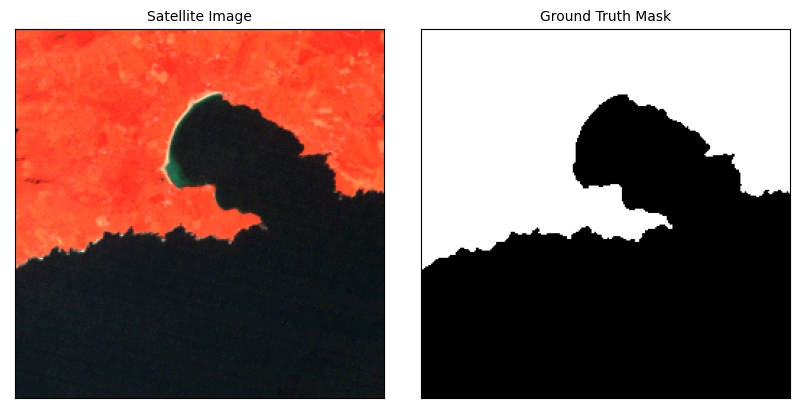

In [51]:
test = np.load(test_paths[4])

# Plot mask and edge map
fig, ax = plt.subplots(1, 2, figsize=(10, 10))

rgb = utils.rgb_from_stack(test,True)
ax[0].imshow(rgb, cmap='gray')
ax[0].set_title('Satellite Image',size=10)

ax[1].imshow(1-test[:,:,-2], cmap='gray')
ax[1].set_title('Ground Truth Mask',size=10)

# reduce space between subplots
plt.subplots_adjust(wspace=0.1)

for a in ax:
    a.set_xticks([])
    a.set_yticks([])

Felzenszwalb number of segments: 41
SLIC number of segments: 226
Quickshift number of segments: 474
Watershed number of segments: 256


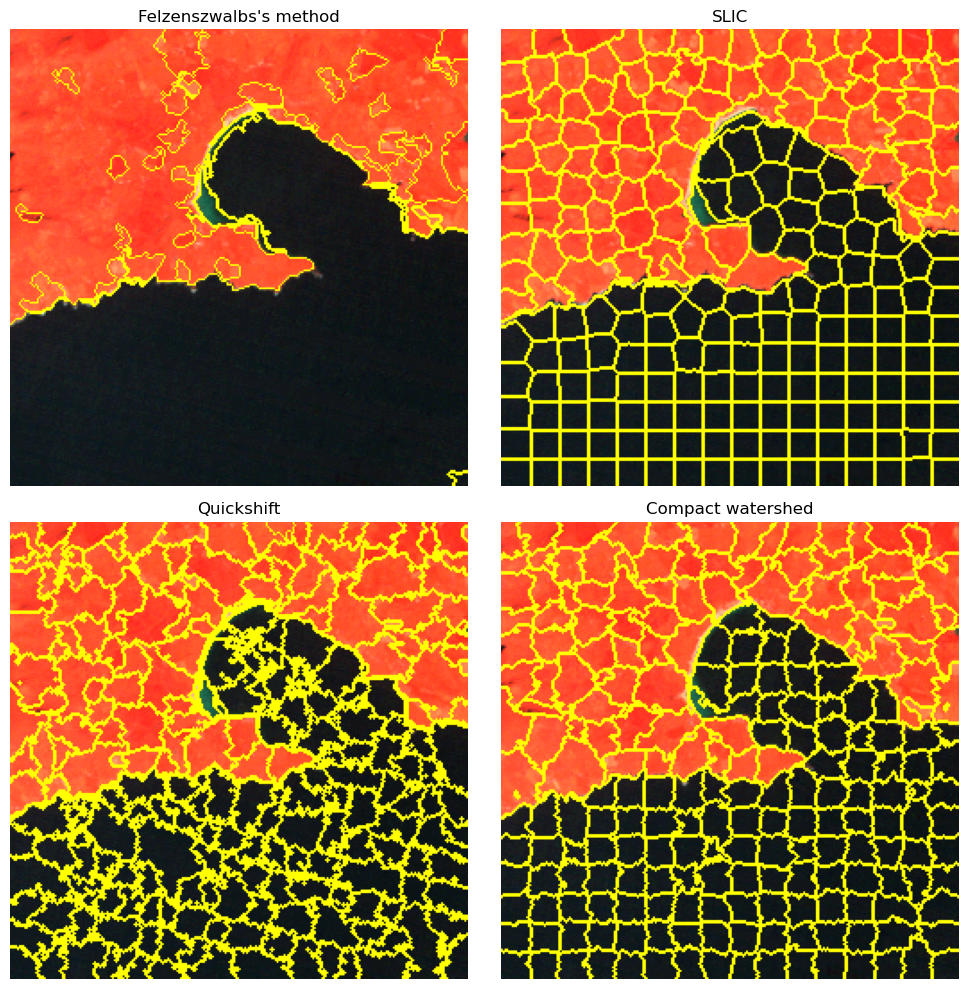

In [54]:
img = rgb.copy()

segments_fz = get_segments(img, method='felzenszwalb', scale=100, sigma=0.5, min_size=50)
segments_slic = get_segments(img, method='slic', n_segments=250, compactness=10, sigma=1)
segments_quick = get_segments(img, method='quickshift', kernel_size=3, max_dist=6, ratio=0.5)
segments_watershed = get_segments(img, method='watershed', markers=250, compactness=0.001)

print(f'Felzenszwalb number of segments: {len(np.unique(segments_fz))}')
print(f'SLIC number of segments: {len(np.unique(segments_slic))}')
print(f'Quickshift number of segments: {len(np.unique(segments_quick))}')
print(f'Watershed number of segments: {len(np.unique(segments_watershed))}')

fig, ax = plt.subplots(2, 2, figsize=(10, 10), sharex=True, sharey=True)

ax[0, 0].imshow(mark_boundaries(img, segments_fz))
ax[0, 0].set_title("Felzenszwalbs's method")
ax[0, 1].imshow(mark_boundaries(img, segments_slic))
ax[0, 1].set_title('SLIC')
ax[1, 0].imshow(mark_boundaries(img, segments_quick))
ax[1, 0].set_title('Quickshift')
ax[1, 1].imshow(mark_boundaries(img, segments_watershed))
ax[1, 1].set_title('Compact watershed')

for a in ax.ravel():
    a.set_axis_off()

plt.tight_layout()
plt.show()

In [152]:
def display_segmentation(input_image,title=True,method='slic', **kwargs):
    # Copy the input image to avoid modifying the original
    img = input_image.copy()
    rgb = utils.rgb_from_stack(img,True)

    segments = get_segments(rgb, method=method, **kwargs)
    index = utils.get_index(img,index='MNDWI') #NDWI 
    pred = get_threshold(index,0.2)

    mask = replace_segments(segments, pred)

    fig, ax = plt.subplots(1, 5, figsize=(15, 5))

    #set overall title to method and kwargs
    if title:
        fig.suptitle(f"{method} {kwargs}", fontsize=16)

    ax[0].imshow(mark_boundaries(rgb, segments))
    ax[0].set_title('Step 1: segmentation')
    ax[1].imshow(index, cmap='gray')
    ax[1].set_title('Step 2: calculate index')
    ax[2].imshow(pred, cmap='gray')
    ax[2].set_title('Step 3: apply threshold')
    ax[3].imshow(mask, cmap='gray')
    ax[3].set_title('Step 4: get segment mode')
    ax[4].imshow(img[:,:,-2], cmap='gray')
    ax[4].set_title('Ground Truth Mask',size=10)

    for a in ax.ravel():
        a.set_xticks([])
        a.set_yticks([])

    plt.tight_layout()

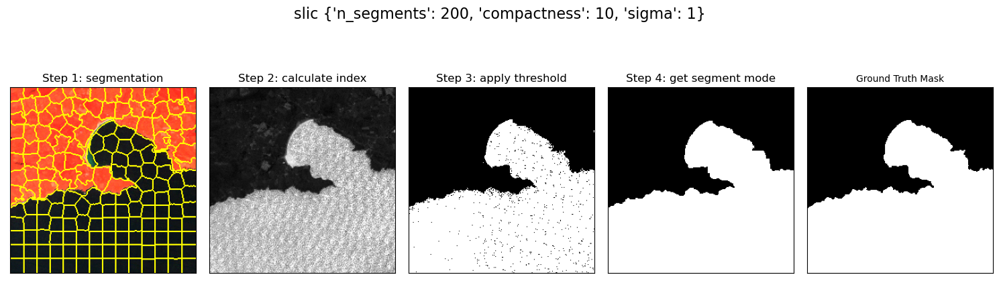

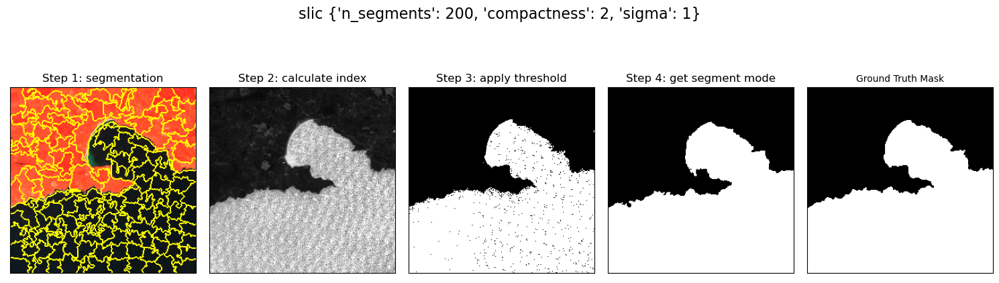

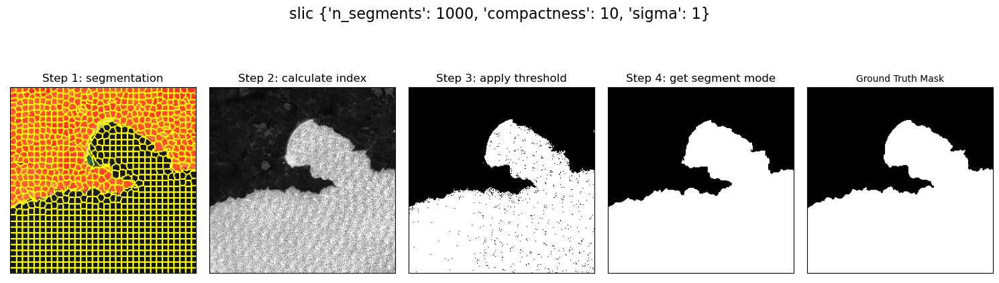

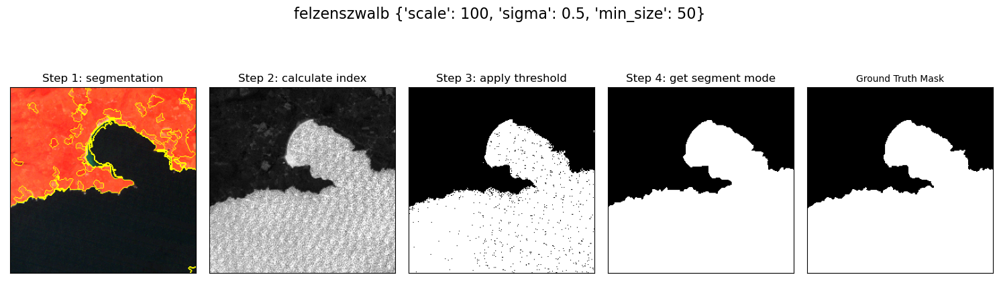

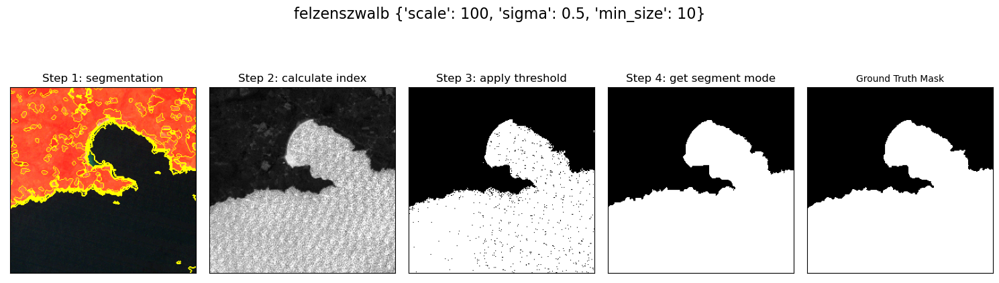

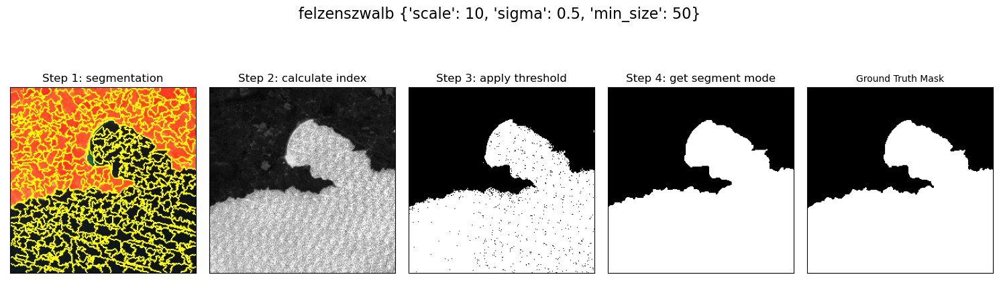

In [153]:
img = np.load(test_paths[4])
#img = utils.rgb_from_stack(test,True)
display_segmentation(img,method='slic', n_segments=200, compactness=10, sigma=1)
display_segmentation(img,method='slic', n_segments=200, compactness=2, sigma=1)
display_segmentation(img,method='slic', n_segments=1000, compactness=10, sigma=1)

display_segmentation(img,method='felzenszwalb', scale=100, sigma=0.5, min_size=50)
display_segmentation(img,method='felzenszwalb', scale=100, sigma=0.5, min_size=10)
display_segmentation(img,method='felzenszwalb', scale=10, sigma=0.5, min_size=50)


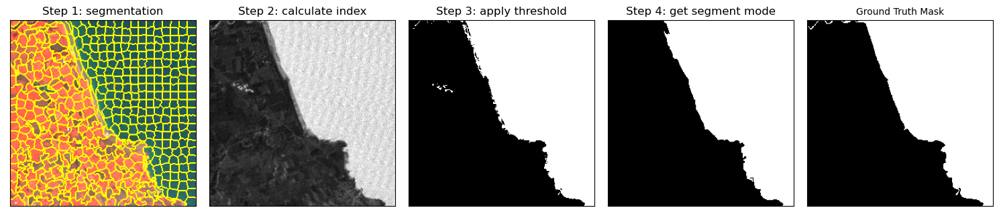

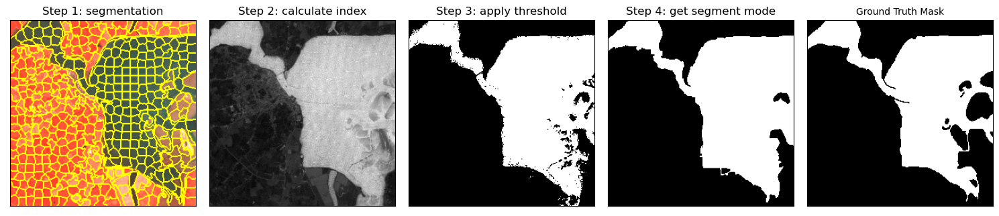

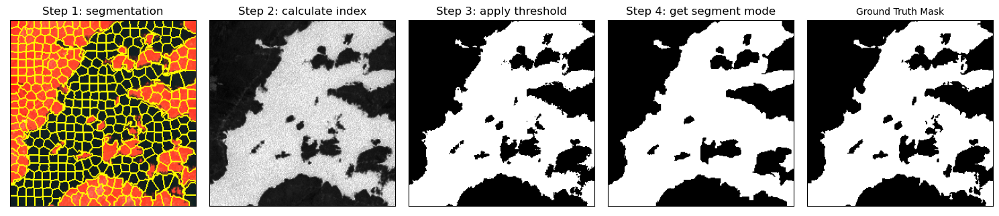

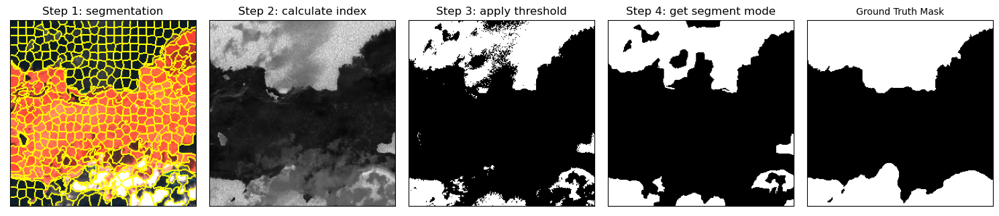

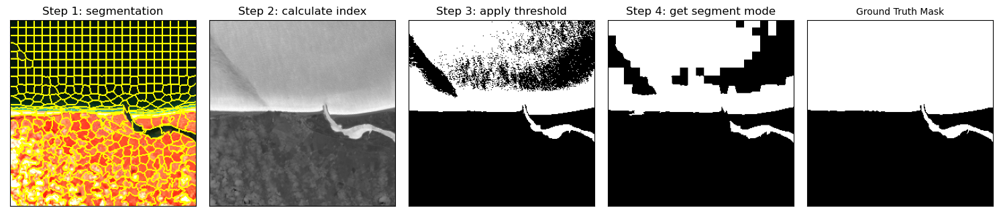

...

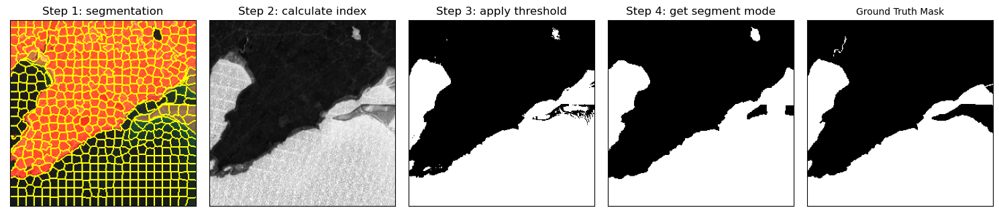

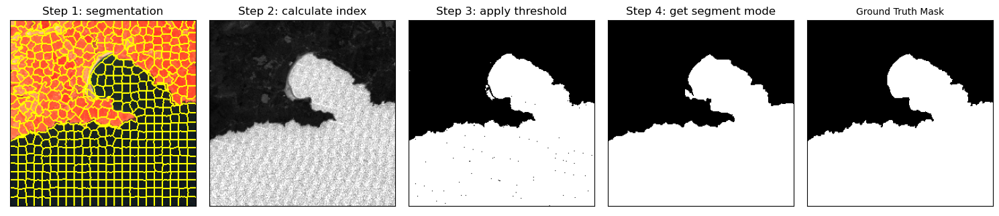

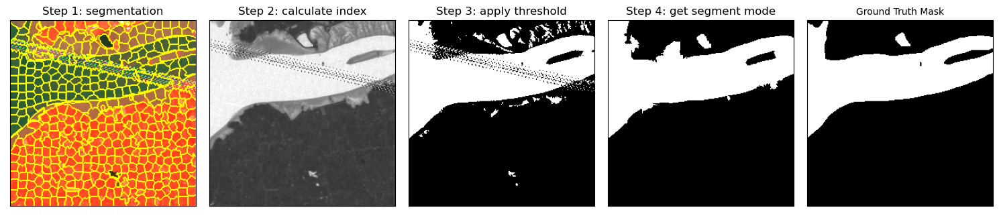

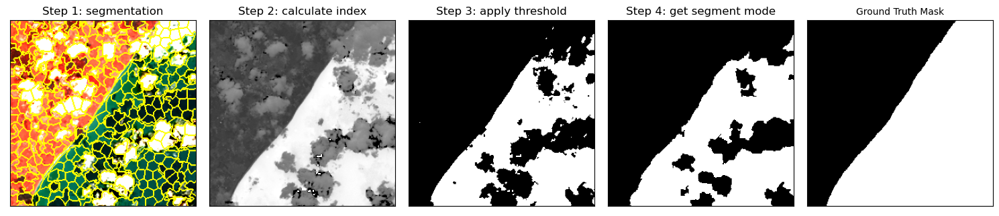

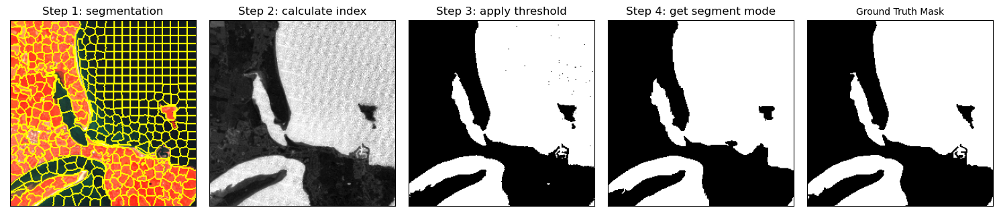

In [156]:
n_segments=500
img = np.load(test_paths[26])
display_segmentation(img,title= False,method='slic', n_segments=n_segments, compactness=10, sigma=1)

img = np.load(test_paths[27])
display_segmentation(img,title= False,method='slic', n_segments=n_segments, compactness=10, sigma=1)

img = np.load(test_paths[15])
display_segmentation(img,title= False,method='slic', n_segments=n_segments, compactness=10, sigma=1)

img = np.load(test_paths[12])
display_segmentation(img,title= False,method='slic', n_segments=n_segments, compactness=10, sigma=1)

img = np.load(test_paths[9])
display_segmentation(img,title= False,method='slic', n_segments=n_segments, compactness=10, sigma=1)

img = np.load(test_paths[8])
display_segmentation(img,title= False,method='slic', n_segments=n_segments, compactness=10, sigma=1)

img = np.load(test_paths[7])
display_segmentation(img,title= False,method='slic', n_segments=n_segments, compactness=10, sigma=1)

img = np.load(test_paths[0])
display_segmentation(img,title= False,method='slic', n_segments=n_segments, compactness=10, sigma=1)

img = np.load(test_paths[1])
display_segmentation(img,title= False,method='slic', n_segments=n_segments, compactness=10, sigma=1)

img = np.load(test_paths[2])
display_segmentation(img,title= False,method='slic', n_segments=n_segments, compactness=10, sigma=1)

img = np.load(test_paths[3])
display_segmentation(img,title= False,method='slic', n_segments=n_segments, compactness=10, sigma=1)


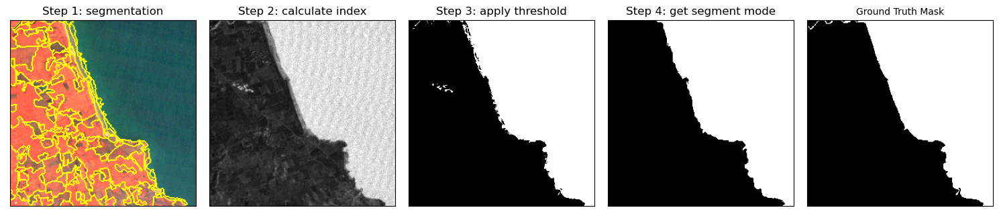

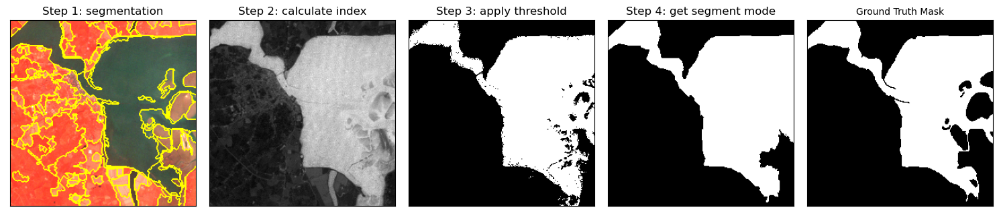

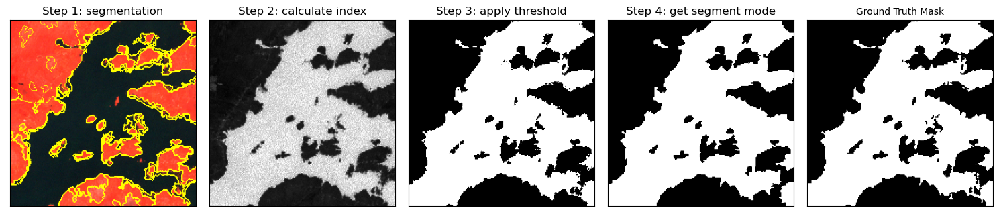

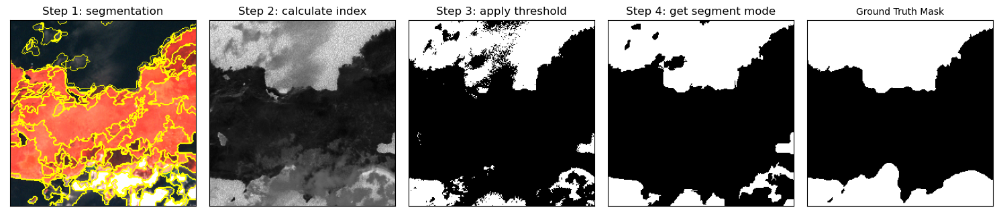

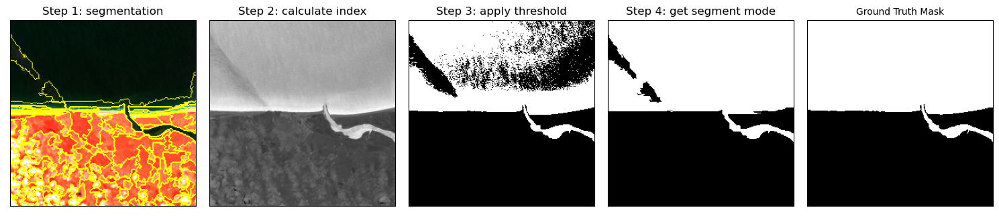

...

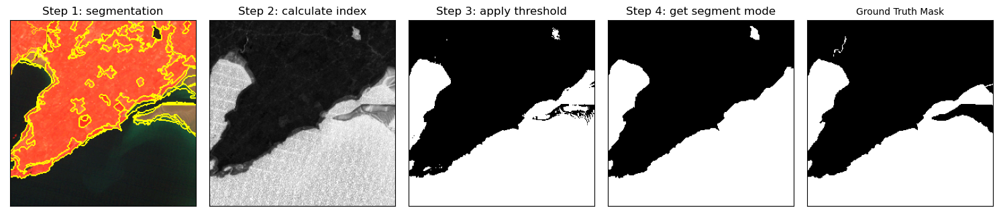

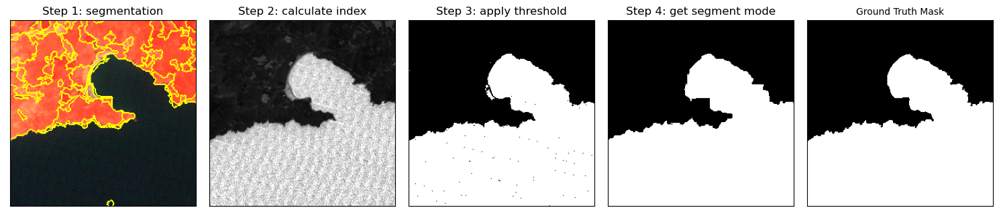

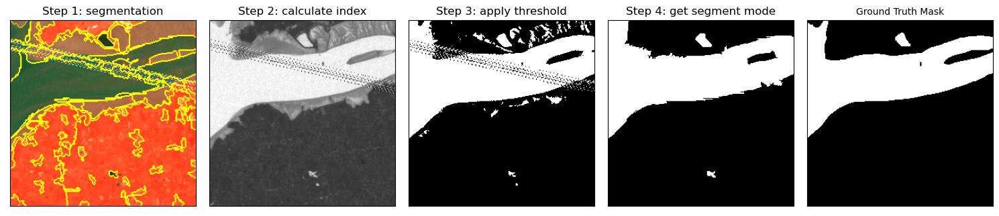

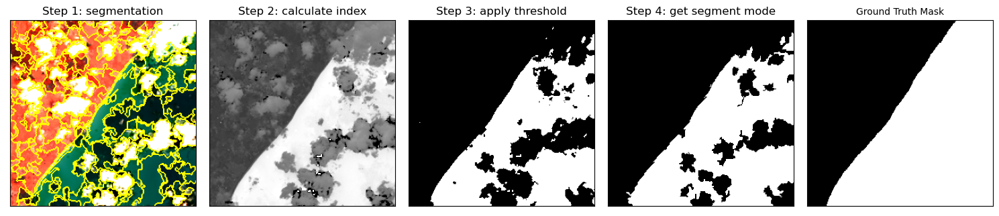

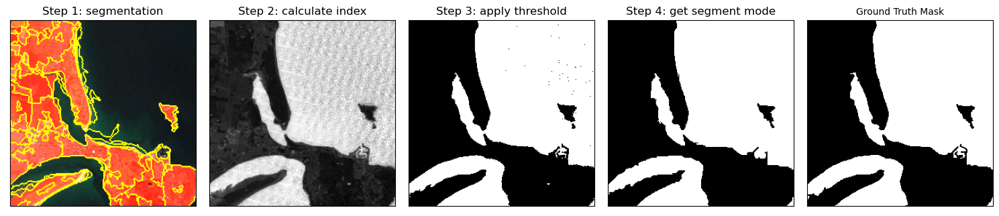

In [157]:
scale=100
min_size=50
img = np.load(test_paths[26])
display_segmentation(img,title= False,method='felzenszwalb', scale=scale, sigma=0.5, min_size=min_size)

img = np.load(test_paths[27])
display_segmentation(img,title= False,method='felzenszwalb', scale=scale, sigma=0.5, min_size=min_size)

img = np.load(test_paths[15])
display_segmentation(img,title= False,method='felzenszwalb', scale=scale, sigma=0.5, min_size=min_size)

img = np.load(test_paths[12])
display_segmentation(img,title= False,method='felzenszwalb', scale=scale, sigma=0.5, min_size=min_size)

img = np.load(test_paths[9])
display_segmentation(img,title= False,method='felzenszwalb', scale=scale, sigma=0.5, min_size=min_size)

img = np.load(test_paths[8])
display_segmentation(img,title= False,method='felzenszwalb', scale=scale, sigma=0.5, min_size=min_size)

img = np.load(test_paths[7])
display_segmentation(img,title= False,method='felzenszwalb', scale=scale, sigma=0.5, min_size=min_size)

img = np.load(test_paths[0])
display_segmentation(img,title= False,method='felzenszwalb', scale=scale, sigma=0.5, min_size=min_size)

img = np.load(test_paths[1])
display_segmentation(img,title= False,method='felzenszwalb', scale=scale, sigma=0.5, min_size=min_size)

img = np.load(test_paths[2])
display_segmentation(img,title= False,method='felzenszwalb', scale=scale, sigma=0.5, min_size=min_size)

img = np.load(test_paths[3])
display_segmentation(img,title= False,method='felzenszwalb', scale=scale, sigma=0.5, min_size=min_size)

In [163]:
def get_prediction(paths,method='slic', **kwargs):
    # Copy the input image to avoid modifying the original
    preds = []
    for path in paths:
        img = np.load(path)
        segments = get_segments(rgb, method=method, **kwargs)
        index = utils.get_index(img,index='MNDWI') #NDWI 
        pred = get_threshold(index,0.2)

        mask = replace_segments(segments, pred)

        preds.append(mask)

    return preds

accuracy: 94.2123
balanced_accuracy: 94.3317
precision: 94.2189
recall: 93.046
f1: 92.9864
mse: 4.0397
fom: 54.7722


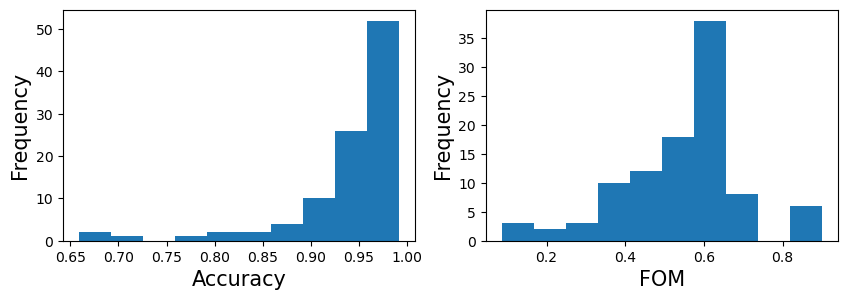

In [164]:
import evaluation as eval
importlib.reload(eval)


preds = get_prediction(test_paths,method='slic', n_segments=500, compactness=10, sigma=1)

metrics, arr = eval.eval_metrics(test_mask,preds)
eval.display_metrics(metrics,arr)

/Users/conorosullivan/Documents/git/COASTAL MONITORING/superpixel-annotation/src/evaluation.py:141: RuntimeWarning: invalid value encountered in long_scalars
  precision = TP_ / (TP_ + FP_)


accuracy: 74.0335
balanced_accuracy: 71.3466
precision: nan
recall: 62.2372
f1: nan
mse: 4.5246
fom: 16.8415


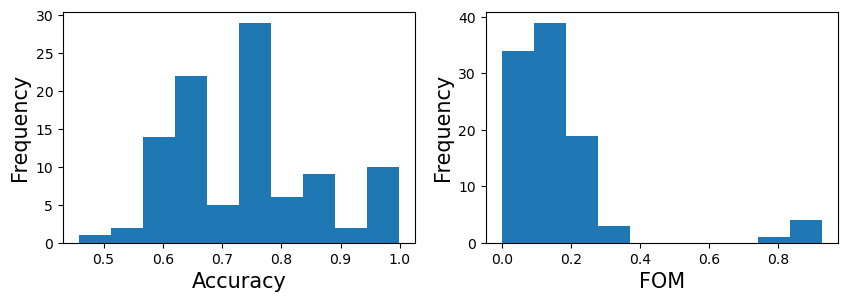

In [165]:
preds = get_prediction(test_paths,method='felzenszwalb', scale=100, sigma=0.5, min_size=50)

metrics, arr = eval.eval_metrics(test_mask,preds)
eval.display_metrics(metrics,arr)